# Flow Matching

- Reference Slides: https://tinyurl.com/3dvss-dit


In [ ]:
import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from IPython.display import HTML
import matplotlib.animation as animation

In [ ]:
# download the font
!wget https://dl.dafont.com/dl/?f=manga_temple -O manga_temple.zip
!unzip manga_temple.zip

--2025-06-27 21:09:44--  https://dl.dafont.com/dl/?f=manga_temple
Resolving dl.dafont.com (dl.dafont.com)... 178.33.111.83
Connecting to dl.dafont.com (dl.dafont.com)|178.33.111.83|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘manga_temple.zip’

manga_temple.zip        [  <=>               ]  46.35K   141KB/s    in 0.3s    

2025-06-27 21:09:45 (141 KB/s) - ‘manga_temple.zip’ saved [47466]

Archive:  manga_temple.zip
  inflating: mangat.ttf              
  inflating: mangati.ttf             
  inflating: mangatb.ttf             
  inflating: font info.txt           


In [ ]:
def create_mask_image(text, font_size=300, image_size=(1600, 800), font_path="/content/mangat.ttf", file_name="my_image.png"):
    lines = text.split('\n')
    image = Image.new('RGB', image_size, color=(0, 0, 0))
    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype(font_path, font_size)
    positions = []
    total_text_height = 0
    line_heights = []
    for line in lines:
        bbox = draw.textbbox((0, 0), line, font=font)
        text_width = bbox[2] - bbox[0]
        text_height = bbox[3] - bbox[1]
        total_text_height += text_height
        line_heights.append(text_height)
        positions.append(((image_size[0] - text_width) / 2, total_text_height))
    spacing = font_size * 0.2
    total_text_height += spacing * (len(lines) - 1)
    y_offset = (image_size[1] - total_text_height) / 2
    current_y = y_offset
    for i, line in enumerate(lines):
        x, _ = positions[i]
        draw.text((x, current_y), line, font=font, fill=(255, 255, 255))
        current_y += line_heights[i] + spacing
    image.save(file_name)



def generate_normal_distribution(num_samples=1000, mean=(0, 0), std=(1, 1)):
    """
    Generate samples from a 2D normal distribution.

    Args:
        num_samples (int): Number of points to generate.
        mean (tuple): Mean of the distribution in (x, y).
        std (tuple): Standard deviation in (x, y).

    Returns:
        torch.Tensor: Tensor of shape (num_samples, 2) with generated points.
    """
    x = np.random.normal(mean[0], std[0], num_samples)
    y = np.random.normal(mean[1], std[1], num_samples)
    points = np.stack([x, y], axis=1)
    min_vals = points.min(axis=0, keepdims=True)[0]
    max_vals = points.max(axis=0, keepdims=True)[0]
    normalized_points = (points - min_vals) / (max_vals - min_vals)

    return torch.tensor(normalized_points, dtype=torch.float32)

def generate_spiral(num_samples=1000, turns=3, noise=0.1):
    """
    Generate samples in a 2D spiral pattern.

    Args:
        num_samples (int): Number of points to generate.
        turns (int): Number of spiral turns.
        noise (float): Amount of random noise to add to the points.

    Returns:
        torch.Tensor: Tensor of shape (num_samples, 2) with spiral points.
    """
    theta = np.linspace(0, 2 * np.pi * turns, num_samples)
    r = theta / (2 * np.pi * turns)  # Radius grows linearly
    x = r * np.cos(theta)
    y = r * np.sin(theta)

    # Add random Gaussian noise
    x += np.random.normal(0, noise, num_samples)
    y += np.random.normal(0, noise, num_samples)

    points = np.stack([x, y], axis=1)
    min_vals = points.min(axis=0, keepdims=True)[0]
    max_vals = points.max(axis=0, keepdims=True)[0]
    normalized_points = (points - min_vals) / (max_vals - min_vals)

    return torch.tensor(normalized_points, dtype=torch.float32)

def sample(image_path, num_samples=1000, sigma=0.04):
    image = Image.open(image_path)
    mask = np.array(image)
    mask = (mask == 255)[:, :, 0]

    letter_indices = np.argwhere(mask)
    sampled_indices = letter_indices[np.random.choice(len(letter_indices), num_samples)]
    x = sampled_indices.astype(np.float32)
    x[:, 0] = -(x[:, 0] - mask.shape[0] / 2) / (mask.shape[0] / 8)
    x[:, 1] = (x[:, 1] - mask.shape[1] / 2) / (mask.shape[0] / 8)
    x = np.flip(x, 1)
    x = torch.tensor(x.astype('float32'))
    x = x + sigma * torch.randn_like(x)
    return x

In [ ]:
create_mask_image("ZERO", font_size=300, file_name="zero.png")
create_mask_image("ONE", font_size=300, file_name="one.png")

In [ ]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

In [ ]:
img1_path = "/content/zero.png"
img2_path = "/content/one.png"

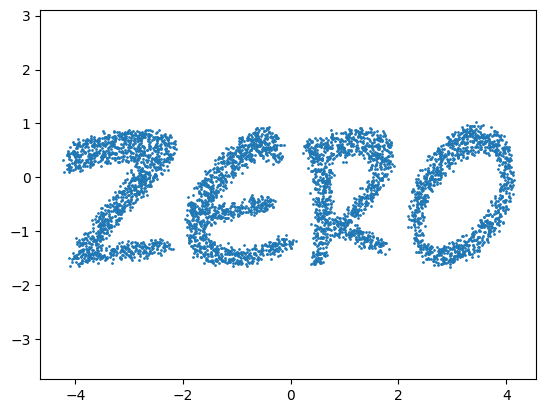

In [ ]:
first = sample(img1_path, num_samples=5000)
samples = first.numpy()
plt.scatter(samples[:, 0], samples[:, 1], s=1)
plt.axis('equal')
plt.show()

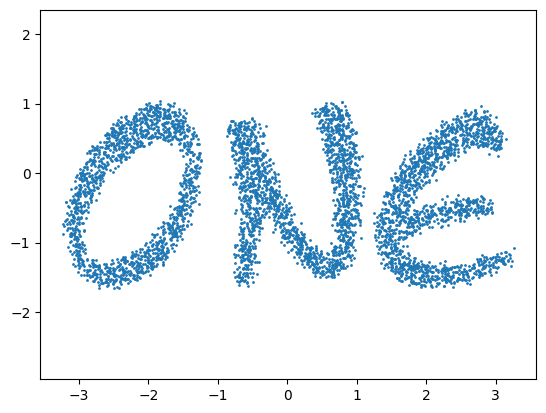

In [ ]:
second = sample(img2_path, num_samples=5000)
samples = second.numpy()
plt.scatter(samples[:, 0], samples[:, 1], s=1)
plt.axis('equal')
plt.show()

In [ ]:
class Swish(nn.Module):
    def forward(self, x):
        return torch.sigmoid(x) * x

class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.layer2 = nn.Linear(hidden_size, hidden_size)
        self.layer3 = nn.Linear(hidden_size, hidden_size)
        self.layer4 = nn.Linear(hidden_size, hidden_size)
        self.layer5 = nn.Linear(hidden_size, output_size)
        self.act = Swish()

    def forward(self, x, t):
        x = torch.cat([t, x], dim=1)
        x = self.act(self.layer1(x))
        x = self.act(self.layer2(x))
        x = self.act(self.layer3(x))
        x = self.act(self.layer4(x))
        out = self.layer5(x)
        return out

In [ ]:
model = MLP(input_size=3, hidden_size=512, output_size=2).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
n_iters = 5000
batch_size = 4000

for iter in range(n_iters):
    optimizer.zero_grad()
    t = torch.rand((batch_size,1)).to(device)
    x0 = sample(img1_path, num_samples=batch_size).to(device)
    x1 = sample(img2_path, num_samples=batch_size).to(device)
    xt = (1-t)*x0 + t*x1
    ut = x1-x0
    vt = model(xt,t)
    loss = (vt - ut).pow(2).mean()

    loss.backward()
    optimizer.step()

    if iter % 1000 == 0:
        print(f'{iter} iters')

0 iters
1000 iters
2000 iters
3000 iters
4000 iters


In [ ]:
x0 = sample(img1_path, num_samples=7000).to(device)
t = torch.zeros((7000,1)).to(device)
xt = x0
N = 100
traj = []
with torch.no_grad():
    for i in range(N):
        vt = model(xt,t)
        xt = xt + vt/N
        t = t + 1/N
        if (i+1) % 2 ==0:
            xt_ = xt.cpu().numpy()
            traj.append(xt_)




In [ ]:
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150
plt.ioff()

fig, ax = plt.subplots(figsize=(4, 4))
def animate(i):
    ax.cla()
    ax.scatter(traj[i][:,0],traj[i][:,1],s=1,c='mediumseagreen')
    ax.axis('off')
    return fig
ani = animation.FuncAnimation(fig, animate, frames=50)
display(ani)